# 1. Data

In [ ]:
import pandas as pd
import numpy as np
import requests
from bs4 import BeautifulSoup

## 1.1. Загрузим данные по пользователям

In [ ]:
users = pd.read_csv('users.csv', names=['user_num', 'link', 'user_name', 'reputation_sum'], header=None)
users

,user_num,link,user_name,reputation_sum
0,1,https://scifi.stackexchange.com/users/20774/va...,valorum,695009
1,2,https://scifi.stackexchange.com/users/976/dvk-...,dvk-on-ahch-to,342931
2,3,https://scifi.stackexchange.com/users/23243/fu...,fuzzyboots,227699
3,4,https://scifi.stackexchange.com/users/2765/tha...,thaddeus-howze,212888
4,5,https://scifi.stackexchange.com/users/3500/sly...,slytherincess,164934
...,...,...,...,...
5395,5396,https://scifi.stackexchange.com/users/487/tanath,tanath,371
5396,5397,https://scifi.stackexchange.com/users/33090/ma...,makyen,370
5397,5398,https://scifi.stackexchange.com/users/26532/an...,andrew-martin,370
5398,5399,https://scifi.stackexchange.com/users/25938/ro...,roman-a-taycher,370


In [ ]:
user_tags = pd.read_csv('user_tags.csv', names=['user_num', 'link', 'user_name', 'tag', 'reputation', 'num_answers'], header=None)
user_tags

,user_num,link,user_name,tag,reputation,num_answers
0,1,https://scifi.stackexchange.com/users/20774/va...,valorum,star-wars,25205,1638
1,1,https://scifi.stackexchange.com/users/20774/va...,valorum,star-trek,20365,1460
2,1,https://scifi.stackexchange.com/users/20774/va...,valorum,harry-potter,13787,742
3,1,https://scifi.stackexchange.com/users/20774/va...,valorum,story-identification,12720,1216
4,1,https://scifi.stackexchange.com/users/20774/va...,valorum,star-trek-tng,8255,515
...,...,...,...,...,...,...
8436,36,https://scifi.stackexchange.com/users/20557/om...,omegacron,space,3,1
8437,36,https://scifi.stackexchange.com/users/20557/om...,omegacron,cyborg,3,1
8438,36,https://scifi.stackexchange.com/users/20557/om...,omegacron,barsoom,3,1
8439,36,https://scifi.stackexchange.com/users/20557/om...,omegacron,venom,3,1


In [ ]:
all_tags = pd.DataFrame(user_tags['tag'].value_counts())
all_tags = all_tags[all_tags['count'] >= 20]
all_tags

,count
tag,
star-wars,35
movie,35
story-identification,34
time-travel,33
harry-potter,32
...,...
the-force,20
the-hobbit,20
magical-creatures,20


## 1.2. Загрузим данные по вопросам

In [ ]:
question_list = pd.read_csv("question_list.csv", header=None)[0].tolist()
len(question_list)

33803

In [ ]:
answer_data = pd.read_csv("answers_res.csv", names=['user_num', 'link', 'num_answer', 'tags', 'is_question', 'answer_text', 'author_name', 'reputation', 'likes'], header=None)
answer_data

,user_num,link,num_answer,tags,is_question,answer_text,author_name,reputation,likes
0,1,https://scifi.stackexchange.com/questions/6887...,0,"['dc', 'superman', 'character-identification',...",True,"In Man of Steel, when Zod attacks the Council,...",Kreann,"8,407",13
1,2,https://scifi.stackexchange.com/questions/1614...,0,['mummy-2017'],True,"In The Mummy 2017, the title character has sym...",CodeMed,10.8k,12
2,3,https://scifi.stackexchange.com/questions/2790...,0,"['story-identification', 'short-stories', 'ali...",True,I've been trying to find this story for years....,Ralph Johnson Jr.,163,16
3,4,https://scifi.stackexchange.com/questions/1211...,0,"['star-wars', 'clones']",True,With reference to Why did the Empire discontin...,thegreatjedi,34.2k,6
4,5,https://scifi.stackexchange.com/questions/1204...,0,"['aliens', 'history-of', 'terminology']",True,"It is fairly common nowadays, for example in S...",ThePopMachine,59.7k,2
...,...,...,...,...,...,...,...,...,...
4815,4996,https://scifi.stackexchange.com/questions/1711...,0,[],True,I'm trying to remember a (short) story I read ...,schnickers,113,5
4816,4997,https://scifi.stackexchange.com/questions/2133...,0,"['harry-potter', 'magical-creatures']",True,What kind of a creature were Madame Maxime's h...,DVK-on-Ahch-To,343k,9
4817,4998,https://scifi.stackexchange.com/questions/2504...,0,"['harry-potter', 'quidditch', 'legilimens']",True,Closed. This question needs to be more focused...,Kathryn,1,-1
4818,4999,https://scifi.stackexchange.com/questions/9751...,0,"['dc', 'comics', 'superman']",True,"When I was a teen and Superman II came out, wh...",Tango,107k,22


In [ ]:
substring = "<a href"
answer_data['problem'] = answer_data['tags'].apply(lambda x: 1 if substring in x else 0)

In [ ]:
answer_data_clean = answer_data[answer_data['problem'] == 0]
answer_data_clean = answer_data_clean.drop(['problem'], axis=1)
answer_data_clean = answer_data_clean.reset_index(drop=True)
answer_data_clean

,user_num,link,num_answer,tags,is_question,answer_text,author_name,reputation,likes
0,1,https://scifi.stackexchange.com/questions/6887...,0,"['dc', 'superman', 'character-identification',...",True,"In Man of Steel, when Zod attacks the Council,...",Kreann,"8,407",13
1,2,https://scifi.stackexchange.com/questions/1614...,0,['mummy-2017'],True,"In The Mummy 2017, the title character has sym...",CodeMed,10.8k,12
2,3,https://scifi.stackexchange.com/questions/2790...,0,"['story-identification', 'short-stories', 'ali...",True,I've been trying to find this story for years....,Ralph Johnson Jr.,163,16
3,4,https://scifi.stackexchange.com/questions/1211...,0,"['star-wars', 'clones']",True,With reference to Why did the Empire discontin...,thegreatjedi,34.2k,6
4,5,https://scifi.stackexchange.com/questions/1204...,0,"['aliens', 'history-of', 'terminology']",True,"It is fairly common nowadays, for example in S...",ThePopMachine,59.7k,2
...,...,...,...,...,...,...,...,...,...
4784,4996,https://scifi.stackexchange.com/questions/1711...,0,[],True,I'm trying to remember a (short) story I read ...,schnickers,113,5
4785,4997,https://scifi.stackexchange.com/questions/2133...,0,"['harry-potter', 'magical-creatures']",True,What kind of a creature were Madame Maxime's h...,DVK-on-Ahch-To,343k,9
4786,4998,https://scifi.stackexchange.com/questions/2504...,0,"['harry-potter', 'quidditch', 'legilimens']",True,Closed. This question needs to be more focused...,Kathryn,1,-1
4787,4999,https://scifi.stackexchange.com/questions/9751...,0,"['dc', 'comics', 'superman']",True,"When I was a teen and Superman II came out, wh...",Tango,107k,22


In [ ]:
questions = answer_data_clean[answer_data_clean['is_question'] == True]
questions

,user_num,link,num_answer,tags,is_question,answer_text,author_name,reputation,likes
0,1,https://scifi.stackexchange.com/questions/6887...,0,"['dc', 'superman', 'character-identification',...",True,"In Man of Steel, when Zod attacks the Council,...",Kreann,"8,407",13
1,2,https://scifi.stackexchange.com/questions/1614...,0,['mummy-2017'],True,"In The Mummy 2017, the title character has sym...",CodeMed,10.8k,12
2,3,https://scifi.stackexchange.com/questions/2790...,0,"['story-identification', 'short-stories', 'ali...",True,I've been trying to find this story for years....,Ralph Johnson Jr.,163,16
3,4,https://scifi.stackexchange.com/questions/1211...,0,"['star-wars', 'clones']",True,With reference to Why did the Empire discontin...,thegreatjedi,34.2k,6
4,5,https://scifi.stackexchange.com/questions/1204...,0,"['aliens', 'history-of', 'terminology']",True,"It is fairly common nowadays, for example in S...",ThePopMachine,59.7k,2
...,...,...,...,...,...,...,...,...,...
4784,4996,https://scifi.stackexchange.com/questions/1711...,0,[],True,I'm trying to remember a (short) story I read ...,schnickers,113,5
4785,4997,https://scifi.stackexchange.com/questions/2133...,0,"['harry-potter', 'magical-creatures']",True,What kind of a creature were Madame Maxime's h...,DVK-on-Ahch-To,343k,9
4786,4998,https://scifi.stackexchange.com/questions/2504...,0,"['harry-potter', 'quidditch', 'legilimens']",True,Closed. This question needs to be more focused...,Kathryn,1,-1
4787,4999,https://scifi.stackexchange.com/questions/9751...,0,"['dc', 'comics', 'superman']",True,"When I was a teen and Superman II came out, wh...",Tango,107k,22


# 2. Похожесть тэгов

In [ ]:
_tags = []

tags = questions['tags']
tags

0       ['dc', 'superman', 'character-identification',...
1                                          ['mummy-2017']
2       ['story-identification', 'short-stories', 'ali...
3                                 ['star-wars', 'clones']
4                 ['aliens', 'history-of', 'terminology']
                              ...                        
4784                                                   []
4785                ['harry-potter', 'magical-creatures']
4786          ['harry-potter', 'quidditch', 'legilimens']
4787                         ['dc', 'comics', 'superman']
4788                                     ['dc', 'batman']
Name: tags, Length: 4789, dtype: object

In [ ]:
_tags = []
import re
for tag in tags:
    tag = tag.replace("'", '')
    tag = tag.replace('[', '')
    tag = tag.replace(']', '')
    tag = tag.replace(',', '')
    _tags.append(re.split(" ", tag))

In [ ]:
list_tags = []
for tag in _tags:
  for t in tag:
    if t != '':  # убираем безтеговые вопросы
        list_tags.append(t)
len(list_tags)

10547

In [ ]:
set_tags = set(list_tags)
len(set_tags)

1142

In [ ]:
df_list_tags = pd.DataFrame(list_tags)
df_list_tags = df_list_tags[0].value_counts().head(2000)
#df_list_tags = df_list_tags[0].value_counts().head(10)
df_list_tags

0
story-identification    1074
harry-potter             681
star-wars                516
star-trek                375
marvel                   362
                        ... 
jonathan-stroud            1
blakes-7                   1
flying-saucer              1
slavery                    1
legilimens                 1
Name: count, Length: 1142, dtype: int64

In [ ]:
df_list_tags = pd.DataFrame(df_list_tags)
set_index_1 = df_list_tags.index
set_index_1

Index(['story-identification', 'harry-potter', 'star-wars', 'star-trek',
       'marvel', 'short-stories', 'tolkiens-legendarium',
       'marvel-cinematic-universe', 'dc', 'movie',
       ...
       'venom-2018', 'the-undiscovered-country', 'constantine-2005',
       'inkheart-trilogy', 'rick-and-morty', 'jonathan-stroud', 'blakes-7',
       'flying-saucer', 'slavery', 'legilimens'],
      dtype='object', name=0, length=1142)

In [ ]:
set_tags = set(set_index_1)
len(set_tags)

1142

In [ ]:
set_tags = pd.DataFrame(set_tags)
tags_dependence = pd.DataFrame(0, index=set_tags[0], columns=set_tags[0])
tags_dependence

,rwby,mockingjay,the-invisible-man,gene-wolfe,music,fma-brotherhood,moon,hawkeye,jurassic-world-fallen-kingdom,time-travel,...,avengers-endgame,flashpoint-paradox,the-clone-wars,toy-story,dungeons-and-dragons,highlander,spider-man-tas,wonder-woman,timeline,captain-kirk
0,,,,,,,,,,,,,,,,,,,,,
rwby,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
mockingjay,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
the-invisible-man,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
gene-wolfe,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
music,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
highlander,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
spider-man-tas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
wonder-woman,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
set_tags = set(set_index_1)
for tag in _tags:
    if (len(tag) == 1 and (tag[0] in set_tags)):
        k = 0
        #tags_dependence[tag[0]][tag[0]] += 1
    elif (len(tag) >= 2):
        for idx, a in enumerate(tag):
            for b in tag[idx + 1:]:
                if ((a in set_tags) and (b in set_tags)):
                    a = str(a)
                    b = str(b)
                    tags_dependence[a][b] += 1
                    tags_dependence[b][a] += 1

tags_dependence

,rwby,mockingjay,the-invisible-man,gene-wolfe,music,fma-brotherhood,moon,hawkeye,jurassic-world-fallen-kingdom,time-travel,...,avengers-endgame,flashpoint-paradox,the-clone-wars,toy-story,dungeons-and-dragons,highlander,spider-man-tas,wonder-woman,timeline,captain-kirk
0,,,,,,,,,,,,,,,,,,,,,
rwby,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
mockingjay,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
the-invisible-man,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
gene-wolfe,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
music,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
highlander,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
spider-man-tas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
wonder-woman,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
import networkx as nx
G = nx.from_numpy_array(tags_dependence.values)
mapping = dict(enumerate(tags_dependence.columns))
G = nx.relabel_nodes(G, mapping)
G.edges(data=True)
print(G)

Graph with 1142 nodes and 3431 edges


посчитаем Jaccard Similarity

In [ ]:
def jaccard(tag1, tag2):
    union = [quest_tag for quest_tag in _tags if (tag1 in quest_tag or tag2 in quest_tag)]
    intersection = [quest_tag for quest_tag in _tags if (tag1 in quest_tag and tag2 in quest_tag)]

    return float(len(intersection) / len(union))

In [ ]:
set_tags = pd.DataFrame(set_tags)
tags_jaccard = pd.DataFrame(0, index=set_tags[0], columns=set_tags[0])
tags_jaccard

,rwby,mockingjay,the-invisible-man,gene-wolfe,music,fma-brotherhood,moon,hawkeye,jurassic-world-fallen-kingdom,time-travel,...,avengers-endgame,flashpoint-paradox,the-clone-wars,toy-story,dungeons-and-dragons,highlander,spider-man-tas,wonder-woman,timeline,captain-kirk
0,,,,,,,,,,,,,,,,,,,,,
rwby,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
mockingjay,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
the-invisible-man,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
gene-wolfe,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
music,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
highlander,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
spider-man-tas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
wonder-woman,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
list_numbers = [0]
list_tags = []

counter_zeroes = 0
counter_non_zeroes = 0
counter_big_values = 0

for i in range (len(set_index_1)):
    tag1 = set_index_1[i]
    for j in range (i + 1, len(set_index_1)):
        tag2 = set_index_1[j]
        _jaccard = jaccard(tag1, tag2)
        if (_jaccard != 0):
            list_numbers.append(_jaccard)
            counter_non_zeroes += 1
            if (_jaccard >= 0.05):
                tags_jaccard[tag1][tag2] = 1
                tags_jaccard[tag1][tag2] = 1
                list_tags.append(tag1)
                list_tags.append(tag2)
                counter_big_values += 1

        else:
            counter_zeroes += 1

In [ ]:
print(counter_zeroes, counter_non_zeroes, counter_big_values)

648080 3431 1131


In [ ]:
set_list_tags = set(list_tags)
len(set_list_tags)

854

In [ ]:
np.percentile(list_numbers, 80)

0.08333333333333333

In [ ]:
col_and_row = list(set_list_tags)
tags_jaccard = tags_jaccard.loc[col_and_row]
tags_jaccard = tags_jaccard[col_and_row]
tags_jaccard

,the-invisible-man,gene-wolfe,music,fma-brotherhood,jurassic-world-fallen-kingdom,time-travel,ms-marvel,time,psychic,alien-franchise,...,avengers-endgame,flashpoint-paradox,the-clone-wars,toy-story,dungeons-and-dragons,spider-man-tas,highlander,wonder-woman,timeline,captain-kirk
0,,,,,,,,,,,,,,,,,,,,,
the-invisible-man,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
gene-wolfe,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
music,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
fma-brotherhood,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
jurassic-world-fallen-kingdom,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
spider-man-tas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
highlander,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
wonder-woman,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
import networkx as nx
G = nx.from_numpy_array(tags_jaccard.values)
mapping = dict(enumerate(tags_jaccard.columns))
G = nx.relabel_nodes(G, mapping)
G.edges(data=True)
print(G)

Graph with 854 nodes and 1131 edges


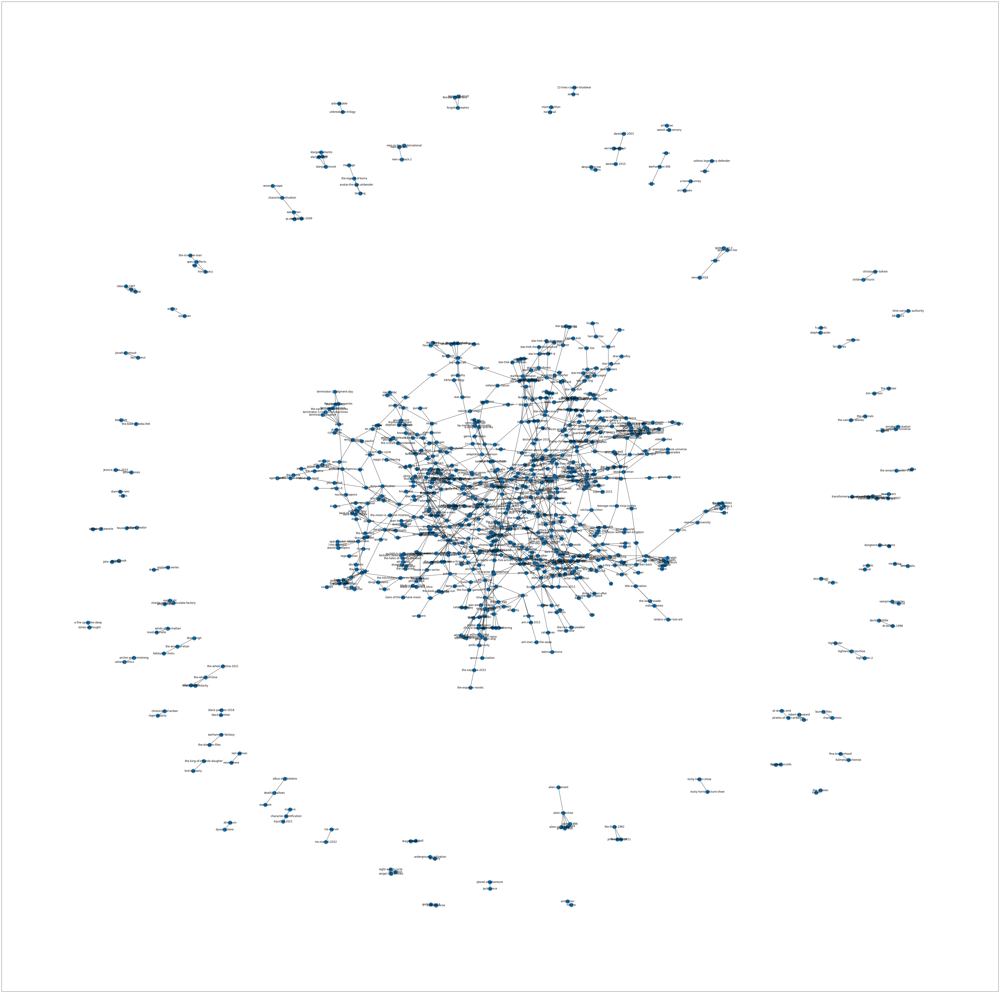

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(80, 80))
nx.draw_networkx(G)

In [ ]:
list_num = [item for item in list_numbers if item > 0.05]
len(list_num)

1097

In [ ]:
perc_0, perc_20, perc_40, perc_60, perc_80 = np.percentile (list_num, [0, 20, 40, 60, 80])
print(perc_0, perc_20, perc_40, perc_60, perc_80)

0.05092592592592592 0.06489533011272142 0.09090909090909091 0.13374570446735395 0.25


In [ ]:
set_tags = pd.DataFrame(set_tags)
tags_jaccard = pd.DataFrame(0, index=set_tags[0], columns=set_tags[0])
tags_jaccard

,rwby,mockingjay,the-invisible-man,gene-wolfe,music,fma-brotherhood,moon,hawkeye,jurassic-world-fallen-kingdom,time-travel,...,avengers-endgame,flashpoint-paradox,the-clone-wars,toy-story,dungeons-and-dragons,highlander,spider-man-tas,wonder-woman,timeline,captain-kirk
0,,,,,,,,,,,,,,,,,,,,,
rwby,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
mockingjay,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
the-invisible-man,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
gene-wolfe,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
music,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
highlander,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
spider-man-tas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
wonder-woman,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
list_numbers = [0]
list_tags = []

counter_zeroes = 0
counter_non_zeroes = 0
counter_big_values = 0

for i in range (len(set_index_1)):
    tag1 = set_index_1[i]
    for j in range (i + 1, len(set_index_1)):
        tag2 = set_index_1[j]
        _jaccard = jaccard(tag1, tag2)
        if (_jaccard != 0):
            list_numbers.append(_jaccard)
            counter_non_zeroes += 1
            if (_jaccard >= perc_0):
                if (_jaccard <= perc_20):
                    tags_jaccard[tag1][tag2] = 1
                    tags_jaccard[tag1][tag2] = 1
                    list_tags.append(tag1)
                    list_tags.append(tag2)
                    counter_big_values += 1
                elif (_jaccard <= perc_40):
                    tags_jaccard[tag1][tag2] = 2
                    tags_jaccard[tag1][tag2] = 2
                    list_tags.append(tag1)
                    list_tags.append(tag2)
                    counter_big_values += 1
                elif (_jaccard <= perc_60):
                    tags_jaccard[tag1][tag2] = 3
                    tags_jaccard[tag1][tag2] = 3
                    list_tags.append(tag1)
                    list_tags.append(tag2)
                    counter_big_values += 1
                elif (_jaccard <= perc_80):
                    tags_jaccard[tag1][tag2] = 4
                    tags_jaccard[tag1][tag2] = 4
                    list_tags.append(tag1)
                    list_tags.append(tag2)
                    counter_big_values += 1
                else:
                    tags_jaccard[tag1][tag2] = 5
                    tags_jaccard[tag1][tag2] = 5
                    list_tags.append(tag1)
                    list_tags.append(tag2)
                    counter_big_values += 1

        else:
            counter_zeroes += 1
print(counter_zeroes, counter_non_zeroes, counter_big_values)

648080 3431 1097


In [ ]:
set_list_tags = set(list_tags)
len(set_list_tags)

848

In [ ]:
col_and_row = list(set_list_tags)
tags_jaccard = tags_jaccard.loc[col_and_row]
tags_jaccard = tags_jaccard[col_and_row]
tags_jaccard

,the-invisible-man,gene-wolfe,music,fma-brotherhood,jurassic-world-fallen-kingdom,time-travel,ms-marvel,time,psychic,alien-franchise,...,avengers-endgame,flashpoint-paradox,the-clone-wars,toy-story,dungeons-and-dragons,spider-man-tas,highlander,wonder-woman,timeline,captain-kirk
0,,,,,,,,,,,,,,,,,,,,,
the-invisible-man,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
gene-wolfe,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
music,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
fma-brotherhood,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
jurassic-world-fallen-kingdom,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
spider-man-tas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
highlander,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
wonder-woman,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
import networkx as nx
G = nx.from_numpy_array(tags_jaccard.values)
mapping = dict(enumerate(tags_jaccard.columns))
G = nx.relabel_nodes(G, mapping)
G.edges(data=True)
print(G)

Graph with 848 nodes and 1097 edges


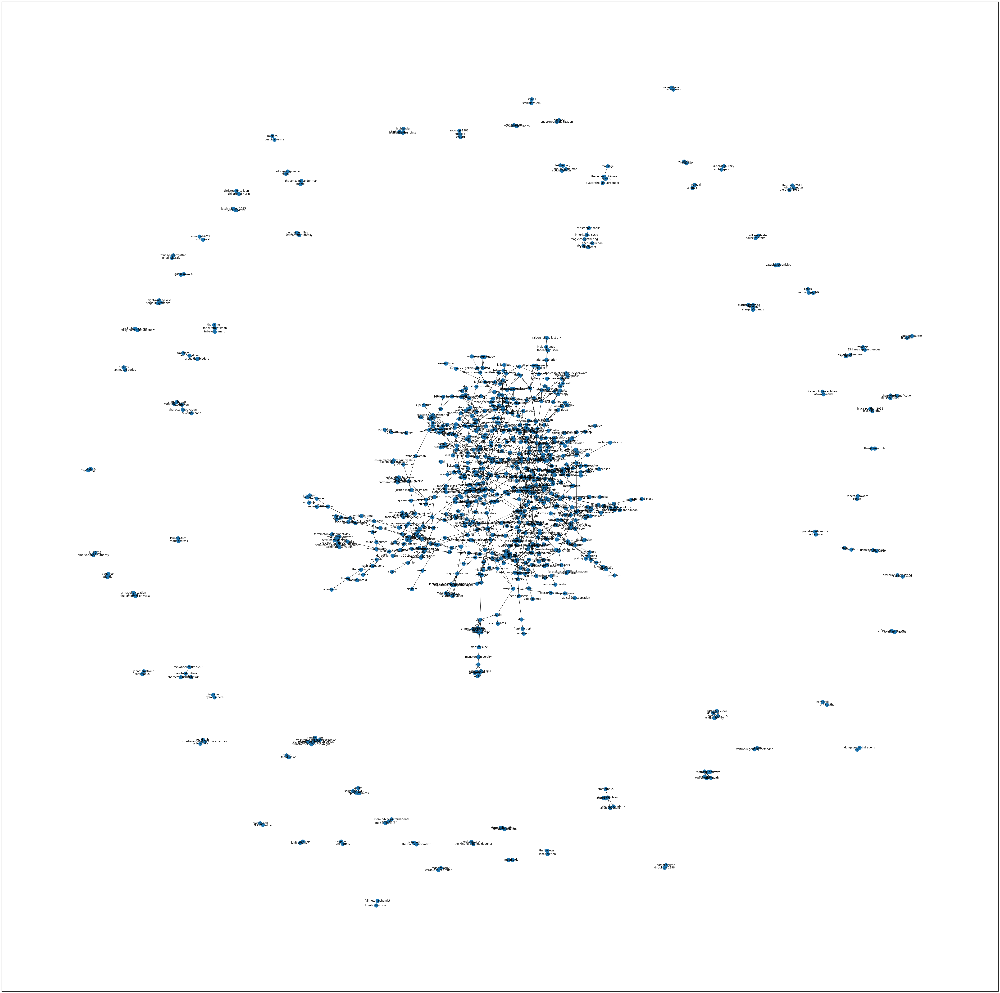

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(80, 80))
nx.draw_networkx(G)

In [ ]:
nx.get_edge_attributes(G, 'weight')

{('the-invisible-man', 'special-effects'): 4,
 ('gene-wolfe', 'publishing'): 4,
 ('gene-wolfe', 'the-book-of-the-new-sun'): 5,
 ('music', 'episode-identification'): 1,
 ('music', 'guardians-of-the-galaxy-2'): 2,
 ('music', 'adaptations'): 3,
 ('music', 'guardians-of-the-galaxy-1'): 2,
 ('music', 'desolation-of-smaug'): 3,
 ('music', 'george-orwell'): 3,
 ('music', '1984'): 3,
 ('fma-brotherhood', 'fullmetal-alchemist'): 5,
 ('jurassic-world-fallen-kingdom', 'jurassic-world'): 5,
 ('jurassic-world-fallen-kingdom', 'jurassic-park'): 5,
 ('time-travel', 'story-identification'): 1,
 ('time-travel', 'short-stories'): 1,
 ('time-travel', 'paradox'): 2,
 ('time-travel', 'back-to-the-future'): 1,
 ('ms-marvel', 'ms-marvel-2022'): 5,
 ('time', 'powers'): 2,
 ('time', 'continuity'): 2,
 ('time', 'jean-le-flambeur'): 4,
 ('time', 'quantum-thief'): 4,
 ('psychic', 'psychology'): 5,
 ('alien-franchise', 'alien-covenant'): 2,
 ('alien-franchise', 'prometheus'): 2,
 ('alien-franchise', 'aliens-1986')

In [ ]:
weights = list(nx.get_edge_attributes(G, 'weight').values())
plt.figure(figsize=(250, 250))
nx.draw_networkx(G, width=weights)

# 2 с половиной (не важно)

In [ ]:
tags_dependence.idxmax()

0
                                 
caribbean                 slavery
assassination        soviet-union
greece           byzantine-empire
old-west            united-states
                       ...       
script                    writing
war-crime           world-war-two
execution                 england
television          united-states
land                   california
Length: 500, dtype: object

In [ ]:
tags_dependence.max()

0
                 704
caribbean          6
assassination      8
greece             8
old-west          13
                ... 
script             5
war-crime         12
execution          3
television         4
land              10
Length: 500, dtype: int64

In [ ]:
set_tags = pd.DataFrame(set_tags)
for i in range (500):
    if (i % 100 == 0):
        print(i)
    row = set_tags[0][i]
    for j in range (500):
        col = set_tags[0][j]

        if (tags_dependence[col][row] != 0):
            tags_dependence[col][row] = tags_dependence[col][row] / df_list_tags['count'][row] * 100

#tags_dependence

In [ ]:
tags_dependence

,,caribbean,assassination,greece,old-west,crime,washington-state,australia,civil-rights,spanish-civil-war,...,enlightenment,indus-valley,hitler,government,anglo-saxons,script,war-crime,execution,television,land
0,,,,,,,,,,,,,,,,,,,,,
,100,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
caribbean,0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
assassination,0,0.0,6.896552,0.000000,0.000000,0.000000,0.0,0.0,3.448276,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
greece,0,0.0,0.000000,2.380952,0.000000,0.000000,0.0,0.0,0.000000,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
old-west,0,0.0,0.000000,0.000000,8.695652,4.347826,0.0,0.0,0.000000,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,4.347826
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
script,0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,...,0.0,23.076923,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
war-crime,0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
execution,0,0.0,0.000000,0.000000,0.000000,8.333333,0.0,0.0,0.000000,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,8.333333,0.0,0.000000


In [ ]:
tags_dependence.sum(axis=1)

0
                 100.000000
caribbean        304.761905
assassination    224.137931
greece           240.476190
old-west         204.347826
                    ...    
script           146.153846
war-crime        247.368421
execution        258.333333
television       243.750000
land             200.000000
Length: 500, dtype: float64

In [ ]:
tags_dependence.idxmax(axis=1)

0
                                 
caribbean                 slavery
assassination        soviet-union
greece           byzantine-empire
old-west            united-states
                       ...       
script                    writing
war-crime           world-war-two
execution                 england
television          united-states
land                   california
Length: 500, dtype: object

In [ ]:
tags_dependence.max(axis=1)

0
                 100.000000
caribbean         28.571429
assassination     27.586207
greece            19.047619
old-west          56.521739
                    ...    
script            38.461538
war-crime         63.157895
execution         25.000000
television        25.000000
land              40.000000
Length: 500, dtype: float64

In [ ]:
sim_tags = pd.DataFrame()
sim_tags['tag'] = list(tags_dependence.index)
sim_tags['freq'] = sim_tags['tag'].apply(lambda x: df_list_tags['count'][x])
sim_tags['sim_tag'] = list(tags_dependence.idxmax(axis=1))
sim_tags['similarity'] = list(tags_dependence.max(axis=1))
sim_tags

,tag,freq,sim_tag,similarity
0,,704,,100.000000
1,caribbean,21,slavery,28.571429
2,assassination,29,soviet-union,27.586207
3,greece,42,byzantine-empire,19.047619
4,old-west,23,united-states,56.521739
...,...,...,...,...
495,script,13,writing,38.461538
496,war-crime,19,world-war-two,63.157895
497,execution,12,england,25.000000
498,television,16,united-states,25.000000


In [ ]:
sim_tags[sim_tags['tag'] == 'world-war-two']

,tag,freq,sim_tag,similarity
180,world-war-two,1890,nazi-germany,24.920635


In [ ]:
sim_tags[sim_tags['tag'] == 'nazi-germany']

,tag,freq,sim_tag,similarity
210,nazi-germany,693,world-war-two,67.965368


In [ ]:
sim_tags[sim_tags['similarity'] >= 75]

,tag,freq,sim_tag,similarity
0,,704,,100.000000
6,washington-state,13,united-states,92.307692
13,atlantic-slave-trade,20,slavery,90.000000
24,cryptology,18,world-war-two,88.888889
25,sparta,18,ancient-greece,94.444444
46,imperial-japan,15,world-war-two,80.000000
60,greco-persian-wars,24,ancient-greece,79.166667
71,punic-wars,23,carthage,86.956522
90,samurai,27,japan,88.888889
104,submarine,50,world-war-two,80.000000


In [ ]:
sim_tags[sim_tags['sim_tag'] == 'world-war-two'].sort_values(by=['similarity'])

,tag,freq,sim_tag,similarity
184,world,41,world-war-two,14.634146
365,war,587,world-war-two,15.161840
412,united-states,1612,world-war-two,15.260546
317,italy,103,world-war-two,15.533981
7,australia,50,world-war-two,16.000000
368,britain,173,world-war-two,16.763006
147,statistics,23,world-war-two,17.391304
409,resource,34,world-war-two,17.647059
403,military,995,world-war-two,17.788945
338,diplomacy,95,world-war-two,17.894737


In [ ]:
tag_dep = tags_dependence.copy()
for i in range (500):
    row = sim_tags['tag'][i]
    col = sim_tags['sim_tag'][i]
    tag_dep[col][row] = -1

In [ ]:
tag_dep.max(axis=1)

0
                  0.000000
caribbean        19.047619
assassination    27.586207
greece           19.047619
old-west         39.130435
                   ...    
script           23.076923
war-crime        47.368421
execution        25.000000
television       18.750000
land             28.000000
Length: 500, dtype: float64

In [ ]:
tag_dep.idxmax(axis=1)

0
                      caribbean
caribbean                piracy
assassination            stalin
greece           ancient-greece
old-west           19th-century
                      ...      
script                 language
war-crime          nazi-germany
execution                   law
television               movies
land                        law
Length: 500, dtype: object

In [ ]:
sim_tags['sec_sim_tag'] = list(tag_dep.idxmax(axis=1))
sim_tags['sec_similarity'] = list(tag_dep.max(axis=1))
sim_tags['sum_similarity'] = sim_tags['similarity'] + sim_tags['sec_similarity']
sim_tags

,tag,freq,sim_tag,similarity,sec_sim_tag,sec_similarity,sum_similarity
0,,704,,100.000000,caribbean,0.000000,100.000000
1,caribbean,21,slavery,28.571429,piracy,19.047619,47.619048
2,assassination,29,soviet-union,27.586207,stalin,27.586207,55.172414
3,greece,42,byzantine-empire,19.047619,ancient-greece,19.047619,38.095238
4,old-west,23,united-states,56.521739,19th-century,39.130435,95.652174
...,...,...,...,...,...,...,...
495,script,13,writing,38.461538,language,23.076923,61.538462
496,war-crime,19,world-war-two,63.157895,nazi-germany,47.368421,110.526316
497,execution,12,england,25.000000,law,25.000000,50.000000
498,television,16,united-states,25.000000,movies,18.750000,43.750000


In [ ]:
sim_tags[sim_tags['similarity'] >= 75]

,tag,freq,sim_tag,similarity,sec_sim_tag,sec_similarity,sum_similarity
0,,704,,100.000000,caribbean,0.000000,100.000000
6,washington-state,13,united-states,92.307692,contemporary-history,46.153846,138.461538
13,atlantic-slave-trade,20,slavery,90.000000,africa,40.000000,130.000000
24,cryptology,18,world-war-two,88.888889,espionage,22.222222,111.111111
25,sparta,18,ancient-greece,94.444444,greco-persian-wars,22.222222,116.666667
46,imperial-japan,15,world-war-two,80.000000,ww2-pacific-theater,60.000000,140.000000
60,greco-persian-wars,24,ancient-greece,79.166667,persia,45.833333,125.000000
71,punic-wars,23,carthage,86.956522,ancient-rome,69.565217,156.521739
90,samurai,27,japan,88.888889,heraldry,18.518519,107.407407
104,submarine,50,world-war-two,80.000000,naval,52.000000,132.000000


In [ ]:
ST = sim_tags[sim_tags['similarity'] >= 75]
ST[ST['sec_similarity'] >= 50]

,tag,freq,sim_tag,similarity,sec_sim_tag,sec_similarity,sum_similarity
46,imperial-japan,15,world-war-two,80.000000,ww2-pacific-theater,60.000000,140.000000
71,punic-wars,23,carthage,86.956522,ancient-rome,69.565217,156.521739
104,submarine,50,world-war-two,80.000000,naval,52.000000,132.000000
128,henry-viii,13,england,84.615385,tudor-period,53.846154,138.461538
135,berlin-wall,17,germany,82.352941,cold-war,58.823529,141.176471
264,norman,13,middle-ages,76.923077,england,61.538462,138.461538
289,stalingrad,25,world-war-two,100.000000,soviet-union,64.000000,164.000000
395,needham,13,china,76.923077,technology,53.846154,130.769231


In [ ]:
ST = sim_tags[sim_tags['similarity'] <= 75]
ST[ST['sec_similarity'] >= 50]

,tag,freq,sim_tag,similarity,sec_sim_tag,sec_similarity,sum_similarity
26,organised-crime,12,crime,58.333333,united-states,50.000000,108.333333
28,political-party,50,political-history,74.000000,united-states,62.000000,136.000000
94,holocaust,109,world-war-two,54.128440,nazi-germany,52.293578,106.422018
132,industry,11,world-war-two,72.727273,soviet-union,54.545455,127.272727
190,confederacy,32,american-civil-war,62.500000,united-states,59.375000,121.875000
359,uniform,122,identification,54.918033,military,50.819672,105.737705
371,great-depression,28,united-states,57.142857,economy,53.571429,110.714286
384,finland,31,soviet-union,54.838710,world-war-two,51.612903,106.451613
449,scramble-for-africa,12,africa,58.333333,colonization,50.000000,108.333333
460,assyrian-empire,14,ancient-babylon,50.000000,ancient-history,50.000000,100.000000


In [ ]:
sim_tags[sim_tags['sum_similarity'] >= 100]

,tag,freq,sim_tag,similarity,sec_sim_tag,sec_similarity,sum_similarity
0,,704,,100.000000,caribbean,0.000000,100.000000
6,washington-state,13,united-states,92.307692,contemporary-history,46.153846,138.461538
9,spanish-civil-war,19,fascism,52.631579,spain,47.368421,100.000000
11,tudor-period,18,england,66.666667,henry-viii,38.888889,105.555556
12,alexander-the-great,36,ancient-greece,55.555556,ancient-history,47.222222,102.777778
13,atlantic-slave-trade,20,slavery,90.000000,africa,40.000000,130.000000
17,macedon,19,ancient-greece,68.421053,alexander-the-great,42.105263,110.526316
24,cryptology,18,world-war-two,88.888889,espionage,22.222222,111.111111
25,sparta,18,ancient-greece,94.444444,greco-persian-wars,22.222222,116.666667
26,organised-crime,12,crime,58.333333,united-states,50.000000,108.333333


# 3. Make final data

In [ ]:
good_tags = list(tags_dependence.index)
len(good_tags)

500

In [ ]:
minor_tags = list(sim_tags[sim_tags['similarity'] >= 75].tag)
len(minor_tags)

33

In [ ]:
major_tags = list(sim_tags[sim_tags['similarity'] >= 75].sim_tag)
len(major_tags)

33

In [ ]:
def clean_tag(tag):
    tag = tag.replace("'", '')
    tag = tag.replace('[', '')
    tag = tag.replace(']', '')
    tag = tag.replace(',', '')
    tags = re.split(" ", tag)

    upd_tags = []
    for t in tags:
        if (t in good_tags):
            if (t in minor_tags):
                idx = minor_tags.index(t)
                major_t = major_tags[idx]
                upd_tags.append(major_t)
            else:
                upd_tags.append(t)

    return list(set(upd_tags))

## 3.1. Данные по вопросам

In [ ]:
answer_data_clean

,user_num,link,num_answer,tags,is_question,answer_text,author_name,reputation,likes
0,1,https://history.stackexchange.com/questions/27...,0,"['united-states', 'election']",True,"From my earliest memory, I've always thought t...",user541852587,255,12
1,1,https://history.stackexchange.com/questions/27...,1,"['united-states', 'election']",False,"Yes. As a matter of fact, 1980 was a pivotal e...",D J Sims,1,11
2,1,https://history.stackexchange.com/questions/27...,2,"['united-states', 'election']",False,The currently accepted answer is a good one*. ...,T.E.D.,119000,14
3,1,https://history.stackexchange.com/questions/27...,3,"['united-states', 'election']",False,"In 1860, the (Republican) ""Party of Lincoln"" w...",Tom Au,105000,2
4,2,https://history.stackexchange.com/questions/91...,0,"['military', 'japan', 'naval', 'russia']",True,"In 1905, during the Russo-Japanese War, a Russ...",Tom Au,105000,23
...,...,...,...,...,...,...,...,...,...
58091,15347,https://history.stackexchange.com/questions/58...,0,"['20th-century', 'europe', 'world-war-one']",True,Closed. This question is opinion-based. It is ...,Person,497,14
58092,15347,https://history.stackexchange.com/questions/58...,1,"['20th-century', 'europe', 'world-war-one']",False,"It is really, really hard to assign guilt or b...",NotVonKaiser,2877,22
58093,15347,https://history.stackexchange.com/questions/58...,2,"['20th-century', 'europe', 'world-war-one']",False,"I understand that writing ""any historians"" you...",Voitcus,7161,4
58094,15347,https://history.stackexchange.com/questions/58...,3,"['20th-century', 'europe', 'world-war-one']",False,"The answer, of course, is that no single count...",two sheds,183000,1


In [ ]:
data_final = answer_data_clean.copy()
data_final['tags'] = answer_data['tags'].apply(lambda x: clean_tag(x))
data_final

,user_num,link,num_answer,tags,is_question,answer_text,author_name,reputation,likes
0,1,https://history.stackexchange.com/questions/27...,0,"[election, united-states]",True,"From my earliest memory, I've always thought t...",user541852587,255,12
1,1,https://history.stackexchange.com/questions/27...,1,"[election, united-states]",False,"Yes. As a matter of fact, 1980 was a pivotal e...",D J Sims,1,11
2,1,https://history.stackexchange.com/questions/27...,2,"[election, united-states]",False,The currently accepted answer is a good one*. ...,T.E.D.,119000,14
3,1,https://history.stackexchange.com/questions/27...,3,"[election, united-states]",False,"In 1860, the (Republican) ""Party of Lincoln"" w...",Tom Au,105000,2
4,2,https://history.stackexchange.com/questions/91...,0,"[military, naval, japan, russia]",True,"In 1905, during the Russo-Japanese War, a Russ...",Tom Au,105000,23
...,...,...,...,...,...,...,...,...,...
58091,15347,https://history.stackexchange.com/questions/58...,0,"[historiography, theoretical-history, philosophy]",True,Closed. This question is opinion-based. It is ...,Person,497,14
58092,15347,https://history.stackexchange.com/questions/58...,1,"[historiography, theoretical-history, philosophy]",False,"It is really, really hard to assign guilt or b...",NotVonKaiser,2877,22
58093,15347,https://history.stackexchange.com/questions/58...,2,"[historiography, theoretical-history, philosophy]",False,"I understand that writing ""any historians"" you...",Voitcus,7161,4
58094,15347,https://history.stackexchange.com/questions/58...,3,"[historiography, theoretical-history, philosophy]",False,"The answer, of course, is that no single count...",two sheds,183000,1


In [ ]:
questions_final = data_final[data_final['is_question'] == True]
questions_final

,user_num,link,num_answer,tags,is_question,answer_text,author_name,reputation,likes
0,1,https://history.stackexchange.com/questions/27...,0,"[election, united-states]",True,"From my earliest memory, I've always thought t...",user541852587,255,12
4,2,https://history.stackexchange.com/questions/91...,0,"[military, naval, japan, russia]",True,"In 1905, during the Russo-Japanese War, a Russ...",Tom Au,105000,23
7,3,https://history.stackexchange.com/questions/10...,0,"[france, monarchy, quotes]",True,I am not well enough read in French history an...,MCW,336000,21
12,4,https://history.stackexchange.com/questions/30...,0,"[language, england]",True,Very difficult to write a good answer; the sou...,MCW,336000,1
13,5,https://history.stackexchange.com/questions/29...,0,"[world, world-war-two]",True,"After the second world war, what happened to a...",Marcus Hellström,29,2
...,...,...,...,...,...,...,...,...,...
58069,15343,https://history.stackexchange.com/questions/12...,0,"[ancient-rome, middle-ages, ancient-history, s...",True,I've read somewhere that the ratio of Soviet t...,RobertLee,862,25
58084,15344,https://history.stackexchange.com/questions/61...,0,"[canada, united-states]",True,"While researching the answer to ""How was Germa...",Martin Sojka,1239,25
58086,15345,https://history.stackexchange.com/questions/37...,0,"[historiography, theoretical-history, philosophy]",True,"Anecdotally, it seems as though species of fau...",Mike Scott,318,14
58089,15346,https://history.stackexchange.com/questions/42...,0,"[historiography, theoretical-history, philosophy]",True,Is it true that the Incas thought that the Spa...,Hiwa K,9,-1


In [ ]:
tags = questions_final['tags']
list_tags = []
for tag in tags:
  for t in tag:
    list_tags.append(t)
len(list_tags)

39935

In [ ]:
set_tags = set(list_tags)
len(set_tags)

468

In [ ]:
df_list_tags = pd.DataFrame(list_tags)
df_list_tags[0].value_counts()

0
world-war-two     2143
united-states     1508
military          1141
middle-ages        906
nazi-germany       796
                  ... 
computers            6
late-antiquity       6
london               6
aviation             6
paris                4
Name: count, Length: 468, dtype: int64

## 3.2. Данные по пользователям

In [ ]:
user_tags = pd.read_csv('user_tags.csv', names=['user_num', 'link', 'user_name', 'tag', 'reputation', 'num_answers'], header=None)
user_tags

,user_num,link,user_name,tag,reputation,num_answers
0,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,united-states,2403,196
1,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,world-war-two,891,68
2,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,political-history,659,52
3,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,middle-ages,588,45
4,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,ancient-history,577,61
...,...,...,...,...,...,...
16890,3459,https://history.stackexchange.com/users/29006/jmw,jmw,japan,8,2
16891,3459,https://history.stackexchange.com/users/29006/jmw,jmw,ww2-pacific-theater,6,1
16892,3459,https://history.stackexchange.com/users/29006/jmw,jmw,international-relations,3,1
16893,3459,https://history.stackexchange.com/users/29006/jmw,jmw,peace-treaty,3,1


In [ ]:
relevant_tags = list(set(good_tags) - set(minor_tags))
len(relevant_tags)

467

In [ ]:
user_tags_final = user_tags[np.isin(user_tags, relevant_tags).any(axis=1)]
user_tags_final

,user_num,link,user_name,tag,reputation,num_answers
0,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,united-states,2403,196
1,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,world-war-two,891,68
2,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,political-history,659,52
3,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,middle-ages,588,45
4,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,ancient-history,577,61
...,...,...,...,...,...,...
16888,3448,https://history.stackexchange.com/users/37835/...,msouth,engineering,5,1
16889,3459,https://history.stackexchange.com/users/29006/jmw,jmw,world-war-two,12,5
16890,3459,https://history.stackexchange.com/users/29006/jmw,jmw,japan,8,2
16892,3459,https://history.stackexchange.com/users/29006/jmw,jmw,international-relations,3,1


In [ ]:
user_tags_final['tag'].value_counts()

tag
world-war-two          187
united-states          178
military               165
20th-century           161
middle-ages            156
                      ... 
scramble-for-africa      6
late-antiquity           4
methodology              4
mussolini                4
electoral-college        2
Name: count, Length: 467, dtype: int64